In [1]:
from aitk.utils import gallery, array_to_image
from aitk.networks import Network
#matplot imports
%matplotlib widget
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import random

import glob #globally searches for the file specified in computer directory
import cv2 #for reading images
import os
import numpy as np

import sklearn
from sklearn.model_selection import train_test_split

import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.utils import to_categorical

# config = tensorflow.ConfigProto()
# config.gpu_options.allow_growth = True
# sess = tensorflow.Session(config=config)

2024-05-05 22:00:13.192686: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


# Experiment with the Kaggle Fruits/Vegetables Dataset

## Loading Data

In [2]:
train_images = []
train_labels = [] 

for directory_path in glob.glob("/scratch/jpacis1/CS63/fruits/train/trainOwn/*"): #searching for file in directory
    label = directory_path.split("/")[-1] #in the directory pathname, taking out the label that is between the '/'
    print(label)
    for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)       
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        train_images.append(img)
        train_labels.append(label)
print(len(train_labels))

Passion Fruit
Cherry
Clementine
Grape Blue
Papaya
Raspberry
Avocado
Limes
Potato Red
Corn
Peach
Mango
Watermelon
Cucumber Ripe
Pineapple
Kiwi
Pear
Apple Granny Smith
Pomegranate
Strawberry
Banana
Tomato
Blueberry
Plum
Orange
Onion White
Pepper Red
Apple Braeburn
Apricot
Lemon
Cantaloupe
Pepper Green
Cactus fruit
12400


In [3]:
test_images = []
test_labels = []
for img_path in glob.glob("/scratch/jpacis1/CS63/fruits/test/testOwn/*"): #searching for file in directory
    label = img_path.split("/")[-1] #in the directory pathname, taking out the label that is between the '/'
    label = label.split("_")[0]
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)       
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    test_images.append(img)
    test_labels.append(label)
print(len(test_labels))

4454


In [4]:
train_dir="/scratch/jpacis1/CS63/fruits/train/trainOwn/"
classes = []
for i in os.listdir(train_dir):
    classes.append(i)

num_classes = len(classes)
print('Classes:',classes)

Classes: ['Passion Fruit', 'Cherry', 'Clementine', 'Grape Blue', 'Papaya', 'Raspberry', 'Avocado', 'Limes', 'Potato Red', 'Corn', 'Peach', 'Mango', 'Watermelon', 'Cucumber Ripe', 'Pineapple', 'Kiwi', 'Pear', 'Apple Granny Smith', 'Pomegranate', 'Strawberry', 'Banana', 'Tomato', 'Blueberry', 'Plum', 'Orange', 'Onion White', 'Pepper Red', 'Apple Braeburn', 'Apricot', 'Lemon', 'Cantaloupe', 'Pepper Green', 'Cactus fruit']


__Normalizing the train images__

In [5]:
train_images = (train_images - np.min(train_images)) / (np.max(train_images) - np.min(train_images))
train_images.shape

(12400, 100, 100, 3)

__Normalizing the test images__

In [6]:
test_images = (test_images - np.min(test_images)) / (np.max(test_images) - np.min(test_images))
test_images.shape

(4454, 100, 100, 3)

__Printing fruits with associating names__

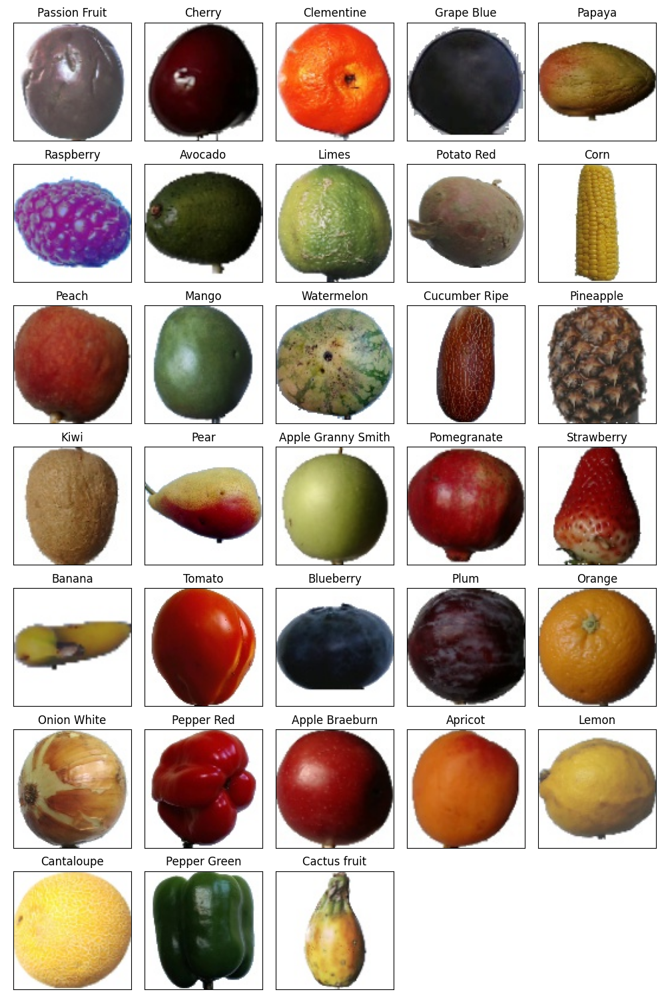

In [7]:
fig = plt.figure(figsize=(10, 15)) 
k = 0
for fruit in classes: 
    for file in os.listdir(train_dir+"/"+fruit)[0:1]: 
        img=mpimg.imread(train_dir+"/"+fruit+"/"+file)
        k=k+1
        plt.subplot(7,5,k) 
        plt.xticks([])
        plt.yticks([])
        plt.title(fruit)
        plt.imshow(img)
plt.tight_layout()

## Preparing the data for the network

In [8]:
min_input = train_images.min()
max_input = train_images.max()
print("Range of input values is:", min_input, max_input)

Range of input values is: 0.0 1.0


__We generate the validation data by taking some of the training data out__

In [9]:
print(train_images.shape)
train_images, valid_images, train_labels, valid_labels = train_test_split(train_images, train_labels, test_size = 0.10)

(12400, 100, 100, 3)


__How much data is in each set (train, valid, and test data)__

In [10]:
print(train_images.shape)
print(valid_images.shape)
print(test_images.shape)

(11160, 100, 100, 3)
(1240, 100, 100, 3)
(4454, 100, 100, 3)


### Target Data

In [11]:
labelMap = {x:i for (i,x) in enumerate(classes)}

In [12]:
trainLabels = [labelMap[x] for (i,x) in enumerate(train_labels)]
validLabels = [labelMap[x] for (i,x) in enumerate(valid_labels)]
testLabels = [labelMap[x] for (i,x) in enumerate(test_labels)]
print(labelMap)

{'Passion Fruit': 0, 'Cherry': 1, 'Clementine': 2, 'Grape Blue': 3, 'Papaya': 4, 'Raspberry': 5, 'Avocado': 6, 'Limes': 7, 'Potato Red': 8, 'Corn': 9, 'Peach': 10, 'Mango': 11, 'Watermelon': 12, 'Cucumber Ripe': 13, 'Pineapple': 14, 'Kiwi': 15, 'Pear': 16, 'Apple Granny Smith': 17, 'Pomegranate': 18, 'Strawberry': 19, 'Banana': 20, 'Tomato': 21, 'Blueberry': 22, 'Plum': 23, 'Orange': 24, 'Onion White': 25, 'Pepper Red': 26, 'Apple Braeburn': 27, 'Apricot': 28, 'Lemon': 29, 'Cantaloupe': 30, 'Pepper Green': 31, 'Cactus fruit': 32}


In [13]:
train_category = to_categorical(trainLabels, len(classes))
valid_category = to_categorical(validLabels, len(classes))
test_category = to_categorical(testLabels, len(classes))

## Construct the model

In [14]:
cnn = Sequential()
cnn.add(Conv2D(5,(3,3),name="conv1",activation="relu",input_shape=(100,100,3)))
cnn.add(MaxPooling2D(pool_size=(2,2),name="pool1"))
cnn.add(Conv2D(7,(3,3),name="conv2",activation="relu",input_shape=(100,100,3)))
cnn.add(MaxPooling2D(pool_size=(2,2),name="pool2"))
cnn.add(Flatten(name="flatten"))
cnn.add(Dense(80, name="hidden", activation="relu"))
cnn.add(Dense(len(classes), name="output", activation="softmax"))
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1 (Conv2D)              (None, 98, 98, 5)         140       
                                                                 
 pool1 (MaxPooling2D)        (None, 49, 49, 5)         0         
                                                                 
 conv2 (Conv2D)              (None, 47, 47, 7)         322       
                                                                 
 pool2 (MaxPooling2D)        (None, 23, 23, 7)         0         
                                                                 
 flatten (Flatten)           (None, 3703)              0         
                                                                 
 hidden (Dense)              (None, 80)                296320    
                                                                 
 output (Dense)              (None, 33)                2

2024-05-05 22:00:38.860252: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-05 22:00:38.871923: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-05 22:00:38.872055: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-05 22:00:38.872782: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compi

## Compile the model

In [15]:
cnn.compile(optimizer="Adam", loss="categorical_crossentropy", metrics=['accuracy'])

## Create the aitk model

This allows a visualization of what is happening inside the network.


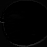
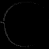
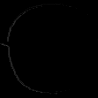
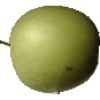

In [16]:
net = Network(cnn)
from time import sleep
for i in range(5):
    net.propagate(train_images[i])
    net.display(train_images[i])
    sleep(1.0)

## Train the model

In [17]:
history = net.fit(train_images, train_category, verbose = 1, validation_data=(valid_images, valid_category), epochs=10)

Epoch 10/10 loss: 7.882125646574423e-05 - accuracy: 1.0 - val_loss: 0.00010156812641071156 - val_accuracy: 1.0


## Inspect the feature maps

Here we'll inspect test image 150

In [18]:
test_image = 150

In [19]:
from math import ceil
for layer in ["conv1", "pool1"]:
    data = [net.propagate_to(test_images[test_image], layer, channel=channel)
            for channel in range(8)]
    largest = max([sublist.max() for sublist in data])
    net.set_config_layer(layer, colormap=("gray", 0, ceil(largest)))

The feature maps in the first convolutional and pooling layer.

channel0,channel1,channel2,channel3,channel4,channel5,,,

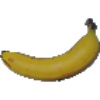
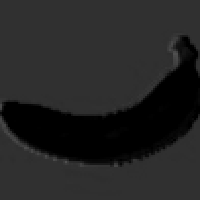
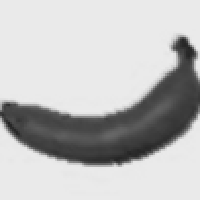
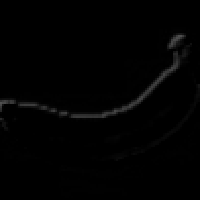
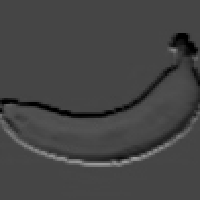
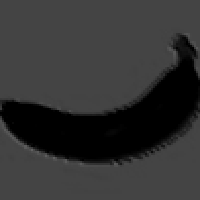

In [20]:
images = [net.propagate_to(test_images[test_image], "conv1", "image", channel=channel)
         for channel in range(5)]
original = test_images[test_image]
bigger = [image.resize((200,200),resample=0) for image in images]
gallery([original] + bigger, labels="channel{index}", gallery_shape=(9,1))

channel0,channel1,channel2,channel3,channel4,channel5,,,

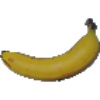
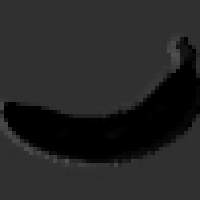
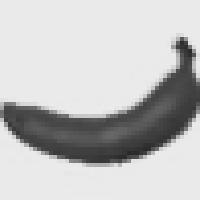
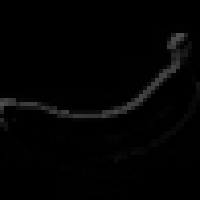
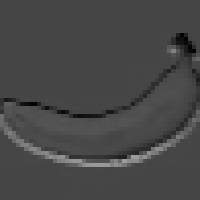
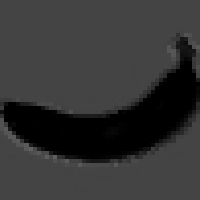

In [21]:
images = [net.propagate_to(test_images[test_image], "pool1", "image", channel=channel)
         for channel in range(5)]
original = test_images[test_image]
bigger = [image.resize((200,200),resample=0) for image in images]
gallery([original] + bigger, labels="channel{index}", gallery_shape=(9,1))

## Examine the results

In [22]:
from numpy import argmax
outputs = net.predict(test_images)
answers = [argmax(output) for output in outputs]
targets = [argmax(target) for target in test_category]

In [23]:
incorrect = [i for i in range(len(answers)) if answers[i] != targets[i]]
len(incorrect)

0

In [24]:
missed_target = [targets[i] for i in incorrect]
wrong_answer = [answers[i] for i in incorrect]

Finding out which target classifications are most frequently missed

In [25]:
from collections import Counter

In [26]:
t_ctr = Counter(missed_target)
t_ctr.most_common()

[]

In [27]:
a_ctr = Counter(wrong_answer)
a_ctr.most_common()

[]

In [28]:
images = [array_to_image(test_images[index]) for index in incorrect]
label = [str(missed_target[i]) + "," + str(wrong_answer[i]) for i in range(len(wrong_answer))]
gallery(images, labels=label)

## Confusion Matrix

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, 'Passion Fruit'),
  Text(1, 0, 'Cherry'),
  Text(2, 0, 'Clementine'),
  Text(3, 0, 'Grape Blue'),
  Text(4, 0, 'Papaya'),
  Text(5, 0, 'Raspberry'),
  Text(6, 0, 'Avocado'),
  Text(7, 0, 'Limes'),
  Text(8, 0, 'Potato Red'),
  Text(9, 0, 'Corn'),
  Text(10, 0, 'Peach'),
  Text(11, 0, 'Mango'),
  Text(12, 0, 'Watermelon'),
  Text(13, 0, 'Cucumber Ripe'),
  Text(14, 0, 'Pineapple'),
  Text(15, 0, 'Kiwi'),
  Text(16, 0, 'Pear'),
  Text(17, 0, 'Apple Granny Smith'),
  Text(18, 0, 'Pomegranate'),
  Text(19, 0, 'Strawberry'),
  Text(20, 0, 'Banana'),
  Text(21, 0, 'Tomato'),
  Text(22, 0, 'Blueberry'),
  Text(23, 0, 'Plum'),
  Text(24, 0, 'Orange'),
  Text(25, 0, 'Onion White'),
  Text(26, 0, 'Pepper Red'),
  Text(27, 0, 'Apple Braeburn'),
  Text(28, 0, 'Apricot'),
  Text(29, 0, 'Lemon'),
  Text(30, 0, 'Cantaloupe'),
  Text(31, 0, 

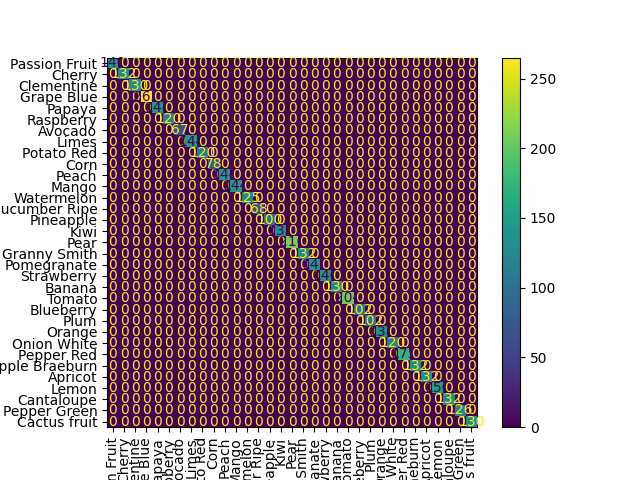

In [29]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
%matplotlib widget

cm = confusion_matrix(targets, answers)
cm_plt = ConfusionMatrixDisplay(cm, display_labels=labelMap)
cm_plt.plot()
plt.xticks(rotation=90)


# Now trying with augmented test data (50% of test images have a colored backgroud)

## Augmenting the test data

__DO NOT have the next two cells uncommented at the same time!
This initial block is used to make a new random set of test data with 50% of the test images having a partially or fully a colored background.__

In [30]:
test_aug_images = []
test_aug_labels = []
index = 0

for img_path in glob.glob("/scratch/jpacis1/CS63/fruits/test/testOwn/*"): #searching for file in directory
    label = img_path.split("/")[-1] #in the directory pathname, taking out the label that is between the '/'
    label = label.split("_")[0]  
    img = cv2.imread(img_path, cv2.IMREAD_COLOR) 
    if index % 2 == 0:
        hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
        s_ch = hsv_img[ :,  :, 1]
        thesh = cv2.threshold(s_ch, 5, 255, cv2.THRESH_BINARY)[1]
        thesh = cv2.morphologyEx(thesh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))) 
        cv2.floodFill(thesh, None, seedPoint=(0, 0), newVal=128, loDiff=1, upDiff=1)
        img[thesh == 128] = (random.randrange(255), random.randrange(255), random.randrange(255))
    index += 1
    #overwrite in a new folder
    new_dir_label = img_path.split("/")[-1]
    new_dir_label = "/scratch/jpacis1/CS63/fruits/test/testRandomColoredBackground/" + new_dir_label
    cv2.imwrite(new_dir_label, img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.array(img)
    test_aug_images.append(img)
    test_aug_labels.append(label)

__Comment this code block if you do not want to generate new test data. Augmented train data already exists in the path specified below. If you just want to load in the test data that has already been generated, comment out the code in the previous cell and uncomment the cell below.__

In [31]:
# test_aug_images = []
# test_aug_labels = []
# for img_path in glob.glob("/scratch/jpacis1/CS63/fruits/test/testOwn/*"): #searching for file in directory
#     label = img_path.split("/")[-1] #in the directory pathname, taking out the label that is between the '/'
#     label = label.split("_")[0]
#     #print(label)
#     img = cv2.imread(img_path, cv2.IMREAD_COLOR)       
#     img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
#     test_aug_images.append(img)
#     test_aug_labels.append(label)
# print(len(test_aug_labels))

In [32]:
test_dir = "/scratch/jpacis1/CS63/fruits/test/testRandomColoredBackground/"
test_classes = []
for i in os.listdir(test_dir):
    test_classes.append(i)

__Normalizing the augmented test images__

In [33]:
test_aug_images = (test_aug_images - np.min(test_aug_images)) / (np.max(test_aug_images) - np.min(test_aug_images))
test_aug_images.shape

(4454, 100, 100, 3)

__Printing the test data with associating classes/labels__

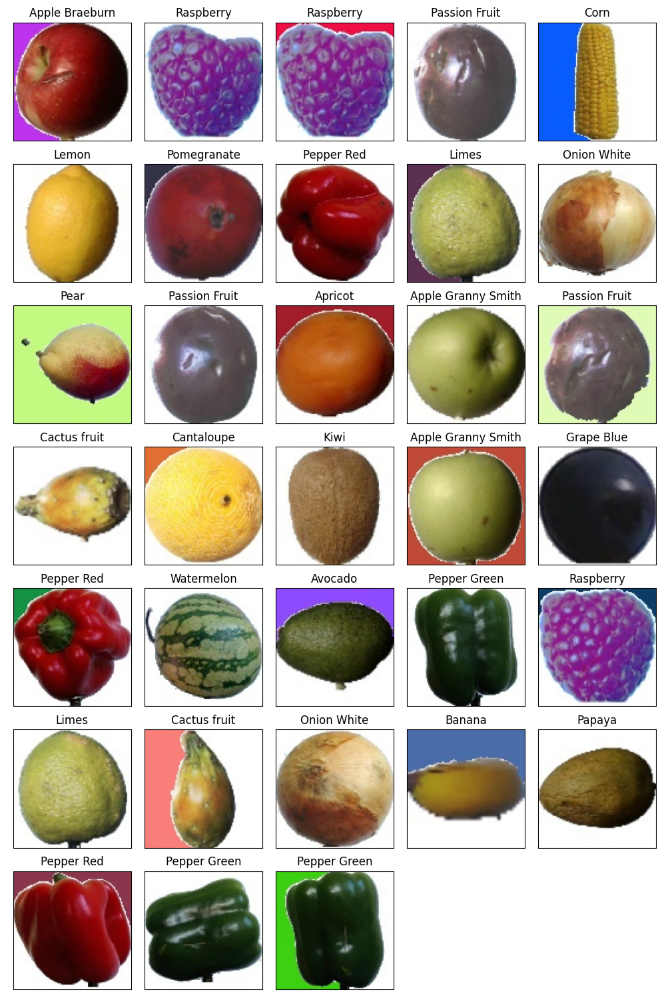

In [34]:
fig = plt.figure(figsize=(10, 15))
k = 0
for i in test_classes[0:33]:
    for file in os.listdir(test_dir)[0:1]:
        img=mpimg.imread(test_dir+i)
        k=k+1
        plt.subplot(7,5,k)
        plt.xticks([])
        plt.yticks([])
        plt.title(i.split("_")[0])
        plt.imshow(img)
plt.tight_layout()

### Target Data

In [35]:
testAugLabels = [labelMap[x] for (i,x) in enumerate(test_aug_labels)]
test_aug_category = to_categorical(testAugLabels, len(classes))

## AITK Model 

This allows visualization of what is happening inside the network.


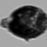
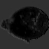
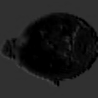
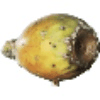

In [36]:
net = Network(cnn)
from time import sleep
for i in range(10):
    net.propagate(train_images[i])
    net.display(train_images[i])
    sleep(1.0)

## Train the model on initial train data and test on augmented data

In [37]:
history2 = net.fit(train_images, train_category, verbose = 1, validation_data=(valid_images, valid_category), epochs=10)

Epoch 10/10 loss: 8.927046110329684e-06 - accuracy: 1.0 - val_loss: 2.0327959646238014e-05 - val_accuracy: 1.0


## Examine results for augmented test data

In [38]:
aug_outputs = net.predict(test_aug_images) 
aug_answers = [argmax(output) for output in aug_outputs] #changed variable names
aug_targets = [argmax(aug_target) for aug_target in test_aug_category]

In [39]:
aug_incorrect = [i for i in range(len(aug_answers)) if aug_answers[i] != aug_targets[i]]
len(aug_incorrect)

291

In [40]:
missed_aug_target = [aug_targets[i] for i in aug_incorrect]
wrong_aug_answer = [aug_answers[i] for i in aug_incorrect]

Finding out which target classifications are most frequently missed

In [41]:
t_ctr = Counter(missed_aug_target)
t_ctr.most_common()

[(16, 50),
 (20, 50),
 (8, 44),
 (3, 31),
 (19, 17),
 (32, 14),
 (21, 10),
 (28, 9),
 (1, 9),
 (9, 7),
 (13, 7),
 (12, 6),
 (15, 6),
 (10, 5),
 (22, 4),
 (18, 4),
 (17, 3),
 (4, 3),
 (6, 3),
 (29, 2),
 (31, 2),
 (25, 2),
 (0, 2),
 (14, 1)]

In [42]:
a_ctr = Counter(wrong_aug_answer)
a_ctr.most_common()

[(13, 70),
 (26, 69),
 (16, 26),
 (32, 20),
 (22, 20),
 (23, 20),
 (2, 13),
 (5, 13),
 (14, 12),
 (12, 6),
 (30, 4),
 (25, 4),
 (9, 3),
 (0, 2),
 (8, 2),
 (20, 2),
 (29, 1),
 (3, 1),
 (27, 1),
 (19, 1),
 (6, 1)]

"9,13","28,2","16,30","13,26","16,26","16,12","20,32","8,13","8,32","20,9","10,2","8,13","20,32","1,26","3,22","29,16","8,13","22,23"
"12,26","16,26","3,22","3,22","28,2","8,16","8,26","20,32","15,16","20,32","20,29","17,16","8,16","8,13","20,32","3,23","20,32","14,26"
"16,26","3,23","8,13","16,13","19,26","18,26","20,14","8,13","22,23","20,26","22,23","3,23","3,22","20,26","9,26","28,2","20,13","3,22"
"16,12","18,26","12,13","20,32","13,5","28,2","8,13","32,16","20,14","18,26","20,13","1,26","16,26","8,16","21,26","16,12","1,26","21,26"
"19,26","12,3","16,13","8,13","8,13","1,26","20,0","19,26","8,13","8,16","16,25","19,26","15,16","20,14","21,26","16,13","20,14","31,14"
"21,26","16,5","16,13","16,13","8,13","19,13","10,2","8,13","3,23","20,13","28,2","10,2","1,26","19,14","20,13","20,32","16,26","3,23"
"19,14","16,12","13,26","8,13","4,26","19,26","19,26","28,2","3,22","32,16","16,26","20,32","16,25","22,23","20,32","1,26","13,26","20,16"
"16,13","16,13","15,13","8,13","25,16","20,9","12,26","16,26","20,13","16,13","3,22","3,22","8,13","19,26","9,26","20,32","8,13","3,23"
"21,26","3,23","16,13","8,13","19,26","32,14","28,2","16,25","3,22","20,32","8,13","3,22","28,2","16,13","32,16","20,12","1,23","20,13"
"20,13","21,26","8,16","8,13","17,32","13,26","4,26","3,22","16,26","19,26","16,25","32,8","10,27","21,26","8,16","6,23","8,16","16,5"
"32,14","0,5","12,26","16,5","6,13","8,5","3,23","15,14","21,26","8,16","1,23","20,13","16,26","3,23","8,20","8,13","29,30","32,16"

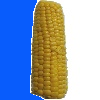
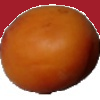
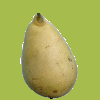
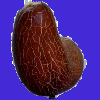
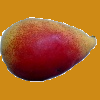
...
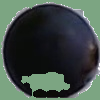
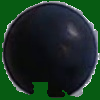
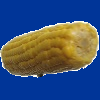
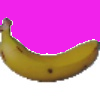
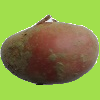

<class 'numpy.ndarray'>


In [43]:
test_aug_images_show = [array_to_image(test_aug_images[index]) for index in aug_incorrect]
test_aug_label = [str(missed_aug_target[i]) + "," + str(wrong_aug_answer[i]) for i in range(len(wrong_aug_answer))]
gallery(test_aug_images_show, labels=test_aug_label)
print(type(test_aug_images[0]))

## Confusion Matrix

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, 'Passion Fruit'),
  Text(1, 0, 'Cherry'),
  Text(2, 0, 'Clementine'),
  Text(3, 0, 'Grape Blue'),
  Text(4, 0, 'Papaya'),
  Text(5, 0, 'Raspberry'),
  Text(6, 0, 'Avocado'),
  Text(7, 0, 'Limes'),
  Text(8, 0, 'Potato Red'),
  Text(9, 0, 'Corn'),
  Text(10, 0, 'Peach'),
  Text(11, 0, 'Mango'),
  Text(12, 0, 'Watermelon'),
  Text(13, 0, 'Cucumber Ripe'),
  Text(14, 0, 'Pineapple'),
  Text(15, 0, 'Kiwi'),
  Text(16, 0, 'Pear'),
  Text(17, 0, 'Apple Granny Smith'),
  Text(18, 0, 'Pomegranate'),
  Text(19, 0, 'Strawberry'),
  Text(20, 0, 'Banana'),
  Text(21, 0, 'Tomato'),
  Text(22, 0, 'Blueberry'),
  Text(23, 0, 'Plum'),
  Text(24, 0, 'Orange'),
  Text(25, 0, 'Onion White'),
  Text(26, 0, 'Pepper Red'),
  Text(27, 0, 'Apple Braeburn'),
  Text(28, 0, 'Apricot'),
  Text(29, 0, 'Lemon'),
  Text(30, 0, 'Cantaloupe'),
  Text(31, 0, 

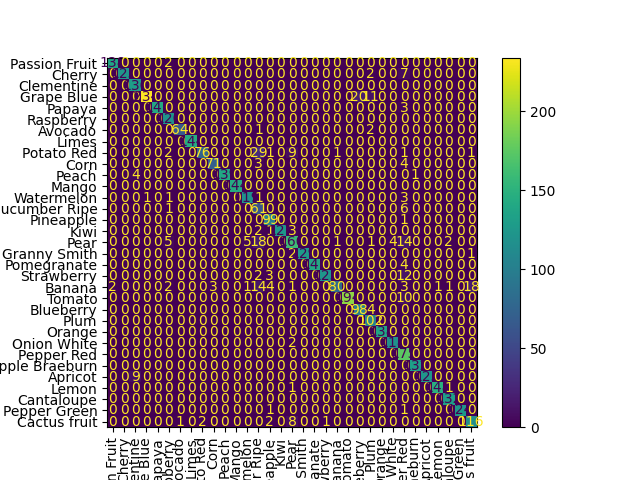

In [44]:
cm = confusion_matrix(aug_targets, aug_answers)
cm_plt = ConfusionMatrixDisplay(cm, display_labels=labelMap)
cm_plt.plot()
plt.xticks(rotation=90)

We see that after only being trained on images with a blank white background, we have very low accuracy when tested on images with background that are partially colored.  

__DO NOT have the next two cells uncommented at the same time!
This initial block is used to make a new random set of train data with 50% of the test images having a partially or fully a colored background.__

In [45]:
train_aug_images = []
train_aug_labels = [] 
index = 0

for directory_path in glob.glob("/scratch/jpacis1/CS63/fruits/train/trainOwn/*"): #searching for file in directory
    label = directory_path.split("/")[-1] #in the directory pathname, taking out the label that is between the '/'
    print(label)
    for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
        img = cv2.imread(img_path, cv2.IMREAD_COLOR)       
        #img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        if index % 2 == 0:
            hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
            s_ch = hsv_img[ :,  :, 1]
            thesh = cv2.threshold(s_ch, 5, 255, cv2.THRESH_BINARY)[1]
            thesh = cv2.morphologyEx(thesh, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))) 
            cv2.floodFill(thesh, None, seedPoint=(0, 0), newVal=128, loDiff=1, upDiff=1)
            img[thesh == 128] = (random.randrange(255), random.randrange(255), random.randrange(255))
        index += 1
        #overwrite in a new folder
        new_dir_label = img_path.split("/")[-1]
        new_dir_label = "/scratch/jpacis1/CS63/fruits/train/trainOwnColoredBackground/" + label + '/' + new_dir_label
        cv2.imwrite(new_dir_label, img)
        #print(new_dir_label)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        train_aug_images.append(img)
        train_aug_labels.append(label)
        # print(label)
print(len(train_aug_labels))

Passion Fruit
Cherry
Clementine
Grape Blue
Papaya
Raspberry
Avocado
Limes
Potato Red
Corn
Peach
Mango
Watermelon
Cucumber Ripe
Pineapple
Kiwi
Pear
Apple Granny Smith
Pomegranate
Strawberry
Banana
Tomato
Blueberry
Plum
Orange
Onion White
Pepper Red
Apple Braeburn
Apricot
Lemon
Cantaloupe
Pepper Green
Cactus fruit
12400


__Comment this block if you do not want to generate new train data. Augmented data has already been generated and exists in the directory path specified below. If you just want to load in the train data that has already been generated, comment out the code in the previous cell and uncomment the cell below.__

In [46]:
# train_aug_images = []
# train_aug_labels = [] 

# for directory_path in glob.glob("/scratch/jpacis1/CS63/fruits/train/trainOwnColoredBackground/*"): #searching for file in directory
#     label = directory_path.split("/")[-1] #in the directory pathname, taking out the label that is between the '/'
#     print(label)
#     for img_path in glob.glob(os.path.join(directory_path, "*.jpg")):
#         img = cv2.imread(img_path, cv2.IMREAD_COLOR)       
#         img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
#         train_aug_images.append(img)
#         train_aug_labels.append(label)
# print(len(train_aug_labels))

In [47]:
train_dir = "/scratch/jpacis1/CS63/fruits/train/trainOwnColoredBackground/"
train_classes = []
for i in os.listdir(train_dir):
    train_classes.append(i)
num_classes = len(train_classes)
print('Classes:', train_classes) 

Classes: ['Passion Fruit', 'Cherry', 'Clementine', 'Grape Blue', 'Papaya', 'Raspberry', 'Avocado', 'Limes', 'Potato Red', 'Corn', 'Peach', 'Mango', 'Watermelon', 'Cucumber Ripe', 'Pineapple', 'Kiwi', 'Pear', 'Apple Granny Smith', 'Pomegranate', 'Strawberry', 'Banana', 'Tomato', 'Blueberry', 'Plum', 'Orange', 'Onion White', 'Pepper Red', 'Apple Braeburn', 'Apricot', 'Lemon', 'Cantaloupe', 'Pepper Green', 'Cactus fruit']


In [48]:
train_aug_images = (train_aug_images - np.min(train_aug_images)) / (np.max(train_aug_images) - np.min(train_aug_images))
train_aug_images.shape

(12400, 100, 100, 3)

In [49]:
train_aug_images, valid_aug_images, train_aug_labels, valid_aug_labels = train_test_split(train_aug_images, train_aug_labels, test_size = 0.10)

In [50]:
trainAugLabels = [labelMap[x] for (i,x) in enumerate(train_aug_labels)]
validAugLabels = [labelMap[x] for (i,x) in enumerate(valid_aug_labels)]

In [51]:
train_aug_category = to_categorical(trainAugLabels, len(classes))
valid_aug_category = to_categorical(validAugLabels, len(classes))

__Printing the augmented train data with associating labels.__

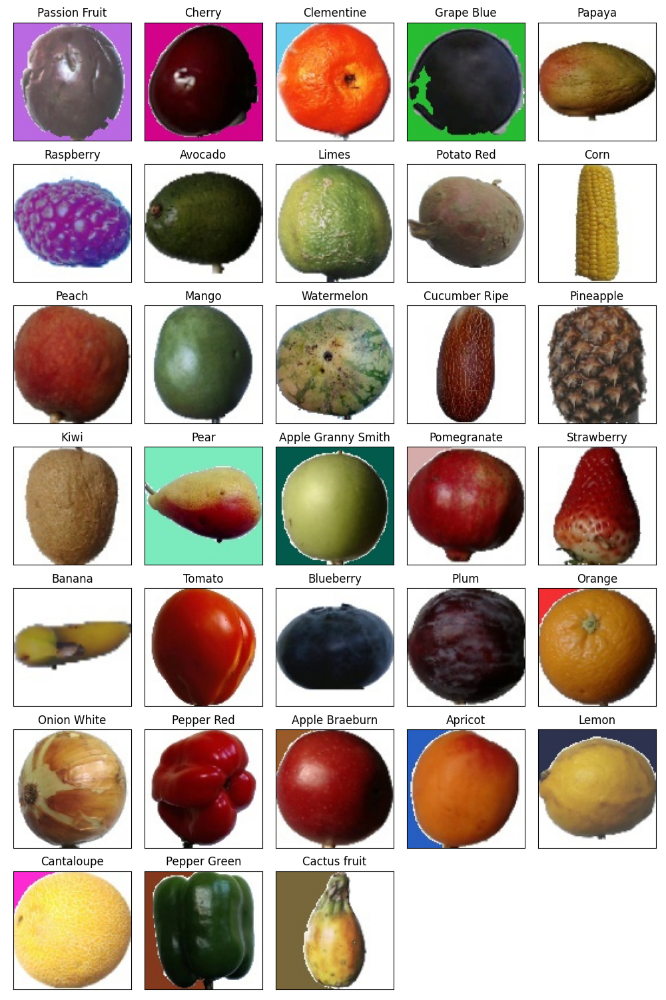

In [52]:
fig = plt.figure(figsize=(10, 15)) 
k = 0
for fruit in classes: 
    for file in os.listdir(train_dir+"/"+fruit)[0:1]: 
        img=mpimg.imread(train_dir+"/"+fruit+"/"+file)
        k=k+1
        plt.subplot(7,5,k) 
        plt.xticks([])
        plt.yticks([])
        plt.title(fruit)
        plt.imshow(img)
plt.tight_layout()

## ATIK Model

This allows visualization of the train augmented images in the network.


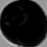
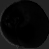
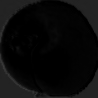
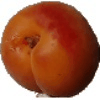

In [53]:
net = Network(cnn)
from time import sleep
for i in range(10):
    net.propagate(train_aug_images[i])
    net.display(train_aug_images[i])
    sleep(1.0)

## Train the model on augmented train data and test on augmented test data

In [54]:
history3 = net.fit(train_aug_images, train_aug_category, verbose = 1, validation_data=(valid_aug_images, valid_aug_category), epochs=10)

Epoch 10/10 loss: 0.00011474166240077466 - accuracy: 1.0 - val_loss: 0.025957273319363594 - val_accuracy: 0.9967741966247559


## Examine results for augmented test data now

In [55]:
aug_outputs = net.predict(test_aug_images) 
aug_answers = [argmax(output) for output in aug_outputs]
aug_targets = [argmax(aug_target) for aug_target in test_aug_category]

In [56]:
aug_incorrect = [i for i in range(len(aug_answers)) if aug_answers[i] != aug_targets[i]]
len(aug_incorrect)

8

In [57]:
missed_aug_target = [aug_targets[i] for i in aug_incorrect]
wrong_aug_answer = [aug_answers[i] for i in aug_incorrect]

In [58]:
t_ctr = Counter(missed_aug_target)
t_ctr.most_common()

[(9, 2), (3, 1), (16, 1), (23, 1), (12, 1), (19, 1), (13, 1)]

In [59]:
a_ctr = Counter(wrong_aug_answer)
a_ctr.most_common()

[(12, 1), (8, 1), (22, 1), (13, 1), (26, 1), (19, 1), (16, 1), (20, 1)]

"3,12","16,8","23,22"
"12,13","19,26","13,19"
"9,16","9,20",

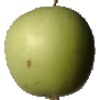
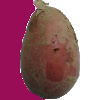
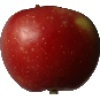
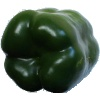
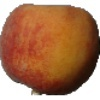
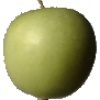
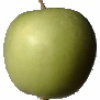
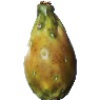

<class 'numpy.ndarray'>


In [60]:
train_aug_images_show = [array_to_image(train_aug_images[index]) for index in aug_incorrect]
train_aug_label = [str(missed_aug_target[i]) + "," + str(wrong_aug_answer[i]) for i in range(len(wrong_aug_answer))]
gallery(train_aug_images_show, labels=train_aug_label)
print(type(train_aug_images[0]))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, 'Passion Fruit'),
  Text(1, 0, 'Cherry'),
  Text(2, 0, 'Clementine'),
  Text(3, 0, 'Grape Blue'),
  Text(4, 0, 'Papaya'),
  Text(5, 0, 'Raspberry'),
  Text(6, 0, 'Avocado'),
  Text(7, 0, 'Limes'),
  Text(8, 0, 'Potato Red'),
  Text(9, 0, 'Corn'),
  Text(10, 0, 'Peach'),
  Text(11, 0, 'Mango'),
  Text(12, 0, 'Watermelon'),
  Text(13, 0, 'Cucumber Ripe'),
  Text(14, 0, 'Pineapple'),
  Text(15, 0, 'Kiwi'),
  Text(16, 0, 'Pear'),
  Text(17, 0, 'Apple Granny Smith'),
  Text(18, 0, 'Pomegranate'),
  Text(19, 0, 'Strawberry'),
  Text(20, 0, 'Banana'),
  Text(21, 0, 'Tomato'),
  Text(22, 0, 'Blueberry'),
  Text(23, 0, 'Plum'),
  Text(24, 0, 'Orange'),
  Text(25, 0, 'Onion White'),
  Text(26, 0, 'Pepper Red'),
  Text(27, 0, 'Apple Braeburn'),
  Text(28, 0, 'Apricot'),
  Text(29, 0, 'Lemon'),
  Text(30, 0, 'Cantaloupe'),
  Text(31, 0, 

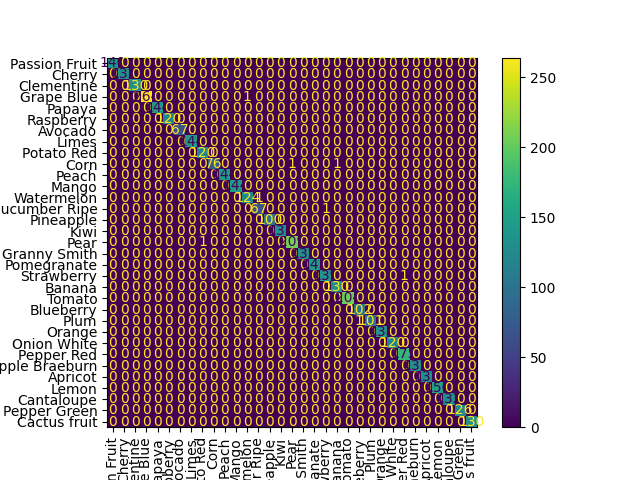

In [61]:
cm = confusion_matrix(aug_targets, aug_answers)
cm_plt = ConfusionMatrixDisplay(cm, display_labels=labelMap)
cm_plt.plot()
plt.xticks(rotation=90)